# Cat and Dog Classification Project

This project aims to classify images of cats and dogs using deep learning through various models. The first model is a dense neural network (without CNN), the second model incorporates convolutional neural networks (CNN), the third model uses CNN with dropout, and the fourth model includes CNN with data augmentation.

It is recommended to run this notebook on Google Colab to leverage the cloud's GPU for faster training.




In [ ]:
import tensorflow as tf
import tensorflow_datasets as tfds
#Descargar el set de datos de perros y gatos desde https://www.tensorflow.org/datasets/catalog/cats_vs_dogs?hl=fr


setattr(tfds.image_classification.cats_vs_dogs, '_URL',"https://download.microsoft.com/download/3/E/1/3E1C3F21-ECDB-4869-8368-6DEBA77B919F/kagglecatsanddogs_5340.zip")
datos, metadatos = tfds.load('cats_vs_dogs', as_supervised=True, with_info=True)

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Generating splits...:   0%|          | 0/1 [00:00<?, ? splits/s]

Generating train examples...:   0%|          | 0/23262 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/cats_vs_dogs/incomplete.AR0TYQ_4.0.1/cats_vs_dogs-train.tfrecord*...:   0%…

Dataset cats_vs_dogs downloaded and prepared to /root/tensorflow_datasets/cats_vs_dogs/4.0.1. Subsequent calls will reuse this data.


In [ ]:
#Contiene imagen, fileman y etiqueda.  Y 23262 ejemplos
metadatos

tfds.core.DatasetInfo(
    name='cats_vs_dogs',
    full_name='cats_vs_dogs/4.0.1',
    description="""
    A large set of images of cats and dogs. There are 1738 corrupted images that are dropped.
    """,
    homepage='https://www.microsoft.com/en-us/download/details.aspx?id=54765',
    data_dir='/root/tensorflow_datasets/cats_vs_dogs/4.0.1',
    file_format=tfrecord,
    download_size=786.67 MiB,
    dataset_size=1.04 GiB,
    features=FeaturesDict({
        'image': Image(shape=(None, None, 3), dtype=uint8),
        'image/filename': Text(shape=(), dtype=string),
        'label': ClassLabel(shape=(), dtype=int64, num_classes=2),
    }),
    supervised_keys=('image', 'label'),
    disable_shuffling=False,
    splits={
        'train': <SplitInfo num_examples=23262, num_shards=16>,
    },
    citation="""@Inproceedings (Conference){asirra-a-captcha-that-exploits-interest-aligned-manual-image-categorization,
    author = {Elson, Jeremy and Douceur, John (JD) and Howell, Jon and Saul, 

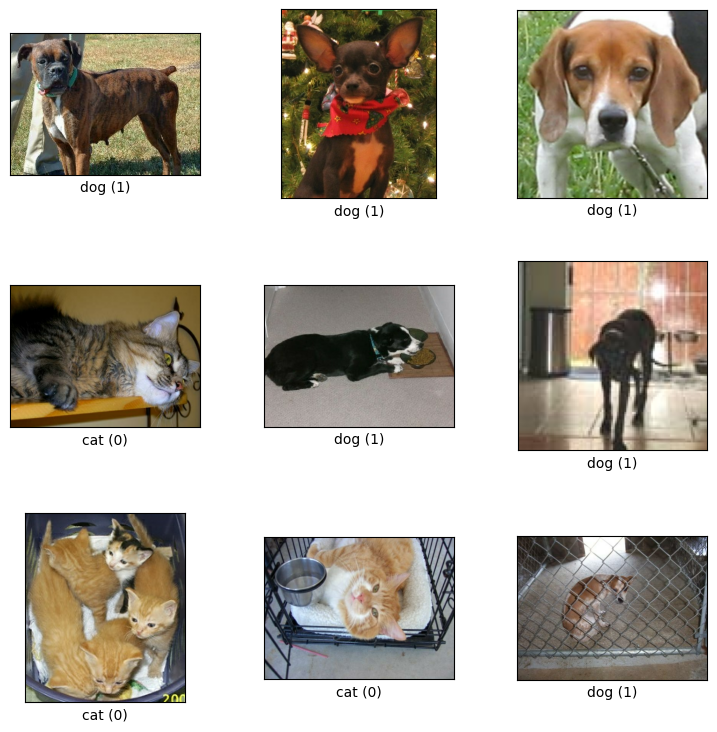

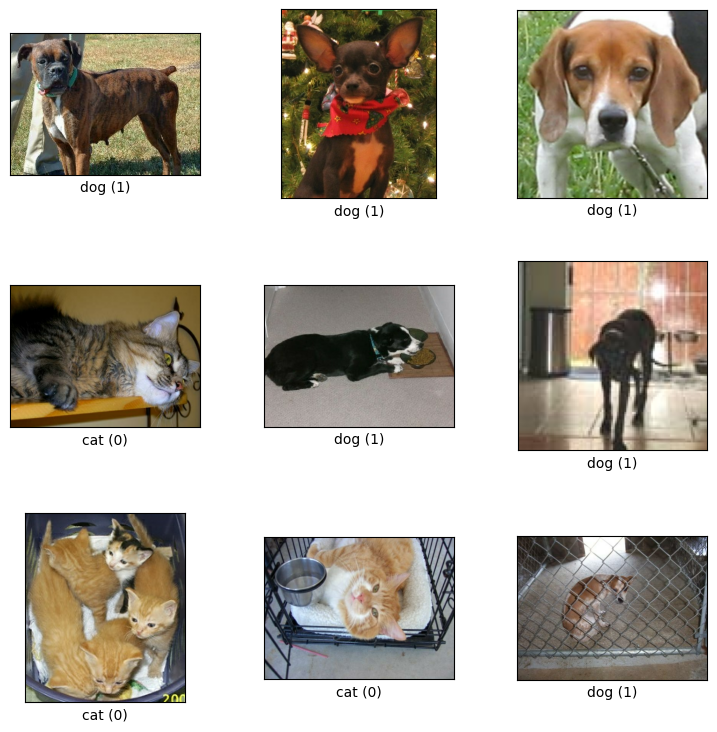

In [ ]:
# Mostrar ejemplos del datset
tfds.show_examples(datos['train'], metadatos)

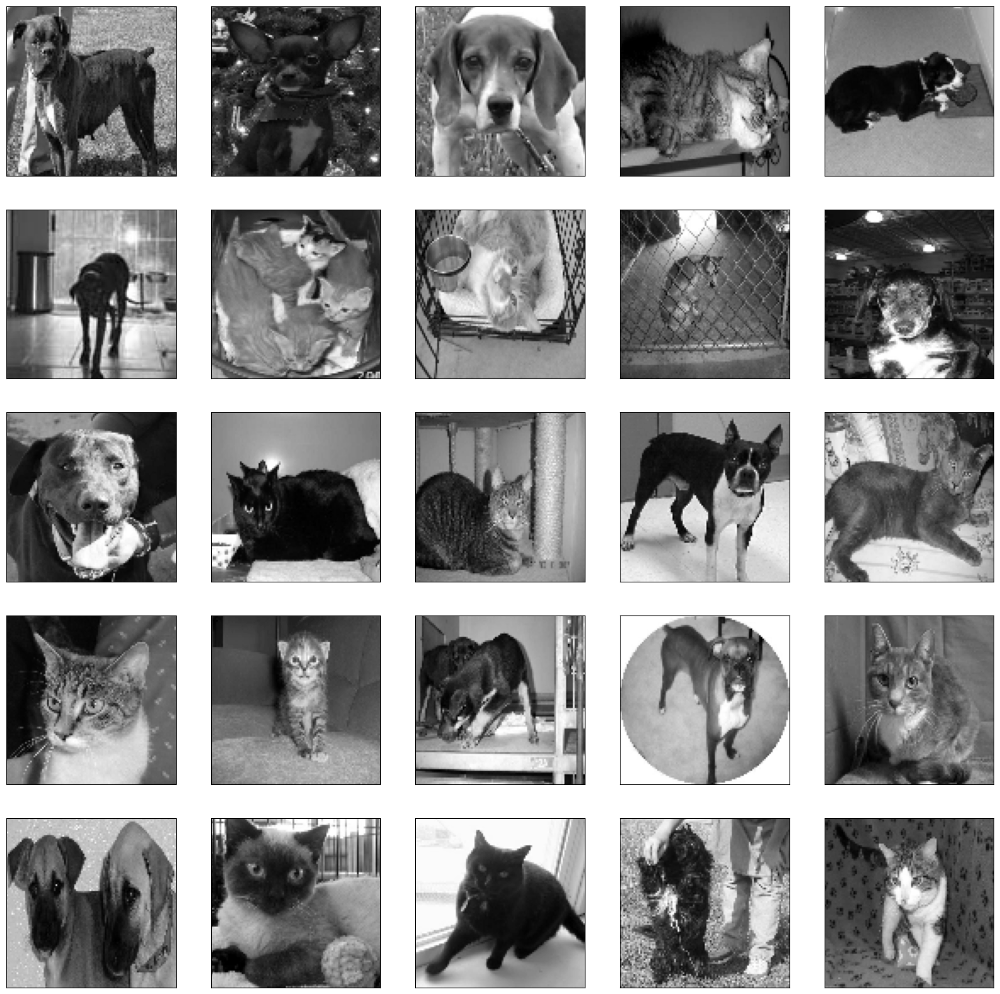

In [ ]:
#Manipular y visualizar el dataset. Cogemos 25 imagenes, 100*100px, blanco y negro
#Lo pasamos a TAMANO_IMG (100x100) y a blanco y negro
import matplotlib.pyplot as plt
import cv2

plt.figure(figsize=(20,20))

#Lo pasamos a TAMANO_IMG (100x100) y a blanco y negro
TAMANO_IMG=100

for i, (imagen, etiqueta) in enumerate(datos['train'].take(25)):
  imagen = cv2.resize(imagen.numpy(), (TAMANO_IMG, TAMANO_IMG)) #CADA IMAGEN 100*100 pixeles
  imagen = cv2.cvtColor(imagen, cv2.COLOR_BGR2GRAY)  #BLANCO  y NEGRO
  plt.subplot(5, 5, i+1)  #5 filas y 5 columnas
  plt.xticks([])
  plt.yticks([])
  plt.imshow(imagen, cmap='gray') #UN CANAL DE COLOR , para que devuelva blanco y negro puro

# Image Preprocessing and Model Creation

After adjusting the images and labels, we proceed to the model creation phase. In this project, we will build and evaluate three distinct models:

1. **Dense Neural Network (DNN):** A simple feedforward neural network without convolutional layers.
2. **Convolutional Neural Network (CNN):** A model leveraging convolutional layers for better feature extraction.
3. **CNN with Dropout and Data Augmentation:** An enhanced CNN model that includes dropout for regularization and data augmentation techniques to improve generalization.

Each model will be trained and evaluated on the task of classifying images of cats and dogs. Running this notebook in Google Colab is recommended for utilizing GPU acceleration.


In [ ]:
#MODIFICAMOS CADA UNO DE LOS DATOS DE ENTRENAMIENTO, TAL Y COMO HICIMOS ARRIBA:
#CAMBIAMOS TODOS LOS DATOS DE  A BLANCO Y NEGRO, CON UN CANAL, Y TAMAñO 100*100px

datos_entrenamiento = []

In [ ]:
for i, (imagen, etiqueta) in enumerate(datos['train']): #Todos los datos
  imagen = cv2.resize(imagen.numpy(), (TAMANO_IMG, TAMANO_IMG))
  imagen = cv2.cvtColor(imagen, cv2.COLOR_BGR2GRAY)
  imagen = imagen.reshape(TAMANO_IMG, TAMANO_IMG, 1) #Cambiar tamano a 100,100,1
  datos_entrenamiento.append([imagen, etiqueta])

NameError: name 'cv2' is not defined

In [ ]:
#Ver los datos del primer indice
#datos_entrenamiento[0]

In [ ]:
#SEPARAR las variables X (entradas) y y (etiquetas)

X = [] #imagenes de entrada (pixeles)
y = [] #etiquetas (perro o gato)

for imagen, etiqueta in datos_entrenamiento:
  X.append(imagen)
  y.append(etiqueta)

In [ ]:
#X

In [ ]:
#Normalizar los datos de las X (imagenes). Se pasan a numero flotante y dividen entre 255 para quedar de 0-1 en lugar de 0-255
import numpy as np

X = np.array(X).astype(float) / 255

In [ ]:
#y

In [ ]:
#Convertir etiquetas en array simple
y = np.array(y)

In [ ]:
X.shape #23262 entradas, con imagenes de 100*100, con colores en blanco y negro (escala de grises)

(23262, 100, 100, 1)

# Step 2: Training the Three Models

In this step, we will train the three models using the preprocessed dataset. Each model will be trained to classify images of cats and dogs, with the goal of improving accuracy and robustness through different techniques:

1. **Dense Model (without CNN):** A simple dense neural network.
2. **CNN Model:** A convolutional neural network to improve feature extraction.
3. **CNN with Dropout:** A CNN model with dropout layers to reduce overfitting.

Training these models will allow us to compare their performance and see how different architectures and techniques affect the classification accuracy.


In [ ]:
#Crear los modelos

#MODELO 1: Sin aumento de datos

modeloDenso = tf.keras.models.Sequential([
  tf.keras.layers.Flatten(input_shape=(100, 100, 1)),
  tf.keras.layers.Dense(150, activation='relu'),
  tf.keras.layers.Dense(150, activation='relu'),
  tf.keras.layers.Dense(1, activation='sigmoid')#Devuelve 1 valor, 0 para gato y 1 para perro
                                                  #(SIGMOIDE devuelve 0 o 1)
])

#MODELO 2: Red Neuronal Convolucional (CNN)

modeloCNN = tf.keras.models.Sequential([
  tf.keras.layers.Conv2D(32, (3,3), activation='relu', input_shape=(100, 100, 1)),
  tf.keras.layers.MaxPooling2D(2, 2),
  tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
  tf.keras.layers.MaxPooling2D(2, 2),
  tf.keras.layers.Conv2D(128, (3,3), activation='relu'),
  tf.keras.layers.MaxPooling2D(2, 2),

  tf.keras.layers.Flatten(),
  tf.keras.layers.Dense(100, activation='relu'),
  tf.keras.layers.Dense(1, activation='sigmoid') #SALIDA TAMBUEN CON SIGMOIDE
])

#MODELO 3: CNN con DROPOUT de 0.5

modeloCNN2 = tf.keras.models.Sequential([
  tf.keras.layers.Conv2D(32, (3,3), activation='relu', input_shape=(100, 100, 1)),
  tf.keras.layers.MaxPooling2D(2, 2),
  tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
  tf.keras.layers.MaxPooling2D(2, 2),
  tf.keras.layers.Conv2D(128, (3,3), activation='relu'),
  tf.keras.layers.MaxPooling2D(2, 2),

  tf.keras.layers.Dropout(0.5),
  tf.keras.layers.Flatten(),
  tf.keras.layers.Dense(250, activation='relu'),
  tf.keras.layers.Dense(1, activation='sigmoid')
])

In [ ]:
#Compilar modelos. Usar crossentropy binario ya que tenemos solo 2 opciones (perro o gato)
modeloDenso.compile(optimizer='adam',
                    loss='binary_crossentropy',
                    metrics=['accuracy'])

modeloCNN.compile(optimizer='adam',
                    loss='binary_crossentropy',
                    metrics=['accuracy'])

modeloCNN2.compile(optimizer='adam',
                    loss='binary_crossentropy',
                    metrics=['accuracy'])

In [ ]:
from tensorflow.keras.callbacks import TensorBoard

In [ ]:
#Tensorboard sirve para ver estadisticas en graficas

#ENTRENAMOS EL PRIMER MODELO:
tensorboardDenso = TensorBoard(log_dir='logs/denso')
modeloDenso.fit(X, y, batch_size=32,
                validation_split=0.15,
                epochs=100,
                callbacks=[tensorboardDenso])

Epoch 1/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 13s 17ms/step - accuracy: 0.5285 - loss: 0.7821 - val_accuracy: 0.5585 - val_loss: 0.6916
Epoch 2/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 8s 12ms/step - accuracy: 0.5741 - loss: 0.6777 - val_accuracy: 0.6003 - val_loss: 0.6692
Epoch 3/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 10s 12ms/step - accuracy: 0.5960 - loss: 0.6653 - val_accuracy: 0.5831 - val_loss: 0.6766
Epoch 4/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 11s 12ms/step - accuracy: 0.5901 - loss: 0.6662 - val_accuracy: 0.6074 - val_loss: 0.6607
Epoch 5/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 7s 12ms/step - accuracy: 0.6011 - loss: 0.6611 - val_accuracy: 0.5977 - val_loss: 0.6710
Epoch 6/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 11s 12ms/step - accuracy: 0.6018 - loss: 0.6586 - val_accuracy: 0.6080 - val_loss: 0.6612
Epoch 7/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 7s 11ms/step - accuracy: 0.6095 - loss: 0.6552 - val_accuracy: 0.6052 - val_loss: 0.6640
Epoch 8/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 7s 12ms/step - accuracy: 0.6154 - loss: 0.655

In [ ]:
#Cargar la extension de tensorboard de colab
%load_ext tensorboard

In [ ]:
#Ejecutar tensorboard e indicarle que lea la carpeta "logs"
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

In [ ]:
tensorboardCNN = TensorBoard(log_dir='logs/cnn')
modeloCNN.fit(X, y, batch_size=32,
                validation_split=0.15,
                epochs=100,
                callbacks=[tensorboardCNN])

Epoch 1/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 28s 33ms/step - accuracy: 0.5852 - loss: 0.6605 - val_accuracy: 0.7350 - val_loss: 0.5347
Epoch 2/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - accuracy: 0.7552 - loss: 0.4987 - val_accuracy: 0.7888 - val_loss: 0.4534
Epoch 3/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - accuracy: 0.8117 - loss: 0.4088 - val_accuracy: 0.8115 - val_loss: 0.4109
Epoch 4/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - accuracy: 0.8349 - loss: 0.3646 - val_accuracy: 0.8246 - val_loss: 0.3780
Epoch 5/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - accuracy: 0.8704 - loss: 0.3037 - val_accuracy: 0.8074 - val_loss: 0.4206
Epoch 6/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - accuracy: 0.8886 - loss: 0.2626 - val_accuracy: 0.8169 - val_loss: 0.4112
Epoch 7/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - accuracy: 0.9098 - loss: 0.2133 - val_accuracy: 0.8312 - val_loss: 0.4064
Epoch 8/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - accuracy: 0.9376 - loss: 0

In [ ]:
tensorboardCNN2 = TensorBoard(log_dir='logs/cnn2')
modeloCNN2.fit(X, y, batch_size=32,
                validation_split=0.15,
                epochs=100,
                callbacks=[tensorboardCNN2])

Epoch 1/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 23s 32ms/step - accuracy: 0.5443 - loss: 0.6824 - val_accuracy: 0.7006 - val_loss: 0.5720
Epoch 2/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - accuracy: 0.7284 - loss: 0.5374 - val_accuracy: 0.7639 - val_loss: 0.4869
Epoch 3/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - accuracy: 0.7928 - loss: 0.4470 - val_accuracy: 0.8083 - val_loss: 0.4233
Epoch 4/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - accuracy: 0.8145 - loss: 0.4033 - val_accuracy: 0.8169 - val_loss: 0.4022
Epoch 5/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - accuracy: 0.8399 - loss: 0.3561 - val_accuracy: 0.8281 - val_loss: 0.4006
Epoch 6/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - accuracy: 0.8689 - loss: 0.3009 - val_accuracy: 0.8476 - val_loss: 0.3565
Epoch 7/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - accuracy: 0.8836 - loss: 0.2676 - val_accuracy: 0.8501 - val_loss: 0.3948
Epoch 8/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - accuracy: 0.9056 - loss: 0

In [ ]:
#Guarddar los 3 modelos:

modeloDenso.save('modeloDenso.keras')
modeloCNN.save('modeloCNN.keras')
modeloCNN2.save('modeloCNN2.keras')


In [ ]:
#Descargar los modelos
from google.colab import files

files.download('modeloDenso.keras')
files.download('modeloCNN.keras')
files.download('modeloCNN2.keras')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# Conclusion of the Three Models

1. **Dense Model:** The first model, which is a dense neural network, struggles to predict new data accurately. While it performs well on the training set, showing that it can learn from the data, its performance on the validation set is significantly lower. This indicates that the model is overfitting, meaning it memorizes the training data but fails to generalize to new, unseen images.
2. **Simple CNN Model:** The second model, a simple Convolutional Neural Network (CNN), shows a much better performance. It reaches 100% accuracy on the training data, indicating that it learns well from the dataset. However, the accuracy on the validation set is lower, around 80%, which suggests that overfitting is still an issue. The model is better at generalizing than the dense model, but there's still room for improvement.
3. **CNN with Dropout:** The third model, which incorporates dropout in the CNN, shows significant improvement. The model generalizes better, reducing overfitting compared to the previous models. However, there are still some losses, indicating that further improvements can be made. While it's a much better performer, especially on the validation set, there's still potential for fine-tuning and optimization.


## Step 4: Implementing Data Augmentation

In this step, we apply data augmentation techniques to further enhance the performance of our CNN model. Data augmentation helps in artificially expanding the size of the training dataset by creating modified versions of images in the dataset. This process introduces variations in the training data, which can improve the model’s ability to generalize to new data.

We'll apply several augmentation techniques such as rotation, zoom, horizontal flipping, and more. This will help in making our model more robust and reduce overfitting.


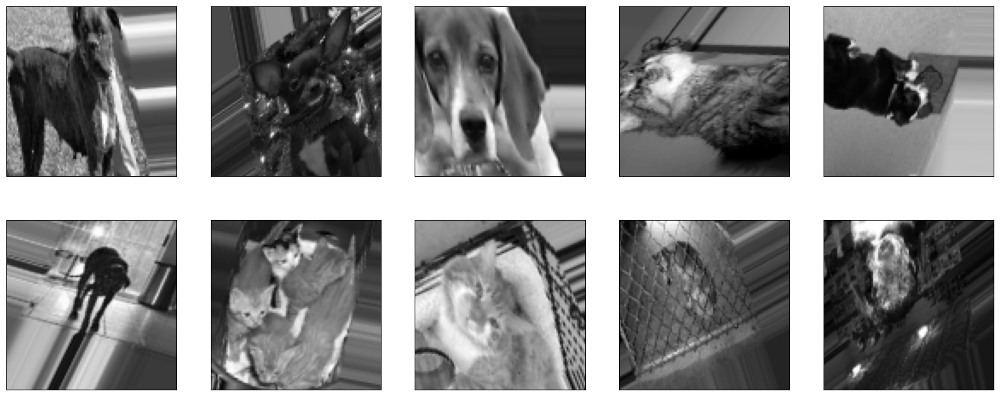

In [ ]:
#Realizar el aumento de datos con varias transformaciones.
from tensorflow.keras.preprocessing.image import ImageDataGenerator

datagen = ImageDataGenerator(
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=15,
    zoom_range=[0.7, 1.4],
    horizontal_flip=True,
    vertical_flip=True
)

datagen.fit(X)


#EJEMPLOS
plt.figure(figsize=(20,8))

for imagen, etiqueta in datagen.flow(X, y, batch_size=10, shuffle=False):
  for i in range(10):
    plt.subplot(2, 5, i+1)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(imagen[i].reshape(100, 100), cmap="gray")
  break

In [ ]:
modeloDenso_AD = tf.keras.models.Sequential([
  tf.keras.layers.Flatten(input_shape=(100, 100, 1)),
  tf.keras.layers.Dense(150, activation='relu'),
  tf.keras.layers.Dense(150, activation='relu'),
  tf.keras.layers.Dense(1, activation='sigmoid')
])

modeloCNN_AD = tf.keras.models.Sequential([
  tf.keras.layers.Conv2D(32, (3,3), activation='relu', input_shape=(100, 100, 1)),
  tf.keras.layers.MaxPooling2D(2, 2),
  tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
  tf.keras.layers.MaxPooling2D(2, 2),
  tf.keras.layers.Conv2D(128, (3,3), activation='relu'),
  tf.keras.layers.MaxPooling2D(2, 2),

  tf.keras.layers.Flatten(),
  tf.keras.layers.Dense(100, activation='relu'),
  tf.keras.layers.Dense(1, activation='sigmoid')
])

modeloCNN2_AD = tf.keras.models.Sequential([
  tf.keras.layers.Conv2D(32, (3,3), activation='relu', input_shape=(100, 100, 1)),
  tf.keras.layers.MaxPooling2D(2, 2),
  tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
  tf.keras.layers.MaxPooling2D(2, 2),
  tf.keras.layers.Conv2D(128, (3,3), activation='relu'),
  tf.keras.layers.MaxPooling2D(2, 2),

  tf.keras.layers.Dropout(0.5),
  tf.keras.layers.Flatten(),
  tf.keras.layers.Dense(250, activation='relu'),
  tf.keras.layers.Dense(1, activation='sigmoid')
])

/usr/local/lib/python3.10/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
modeloDenso_AD.compile(optimizer='adam',
                    loss='binary_crossentropy',
                    metrics=['accuracy'])

modeloCNN_AD.compile(optimizer='adam',
                    loss='binary_crossentropy',
                    metrics=['accuracy'])

modeloCNN2_AD.compile(optimizer='adam',
                    loss='binary_crossentropy',
                    metrics=['accuracy'])

In [ ]:
#Cogemos un 85% del dataset como datos de entrenamiento y el resto como datos de validacion

len(X) * .85 #19700
len(X) - 19700 #3562

X_entrenamiento = X[:19700]
X_validacion = X[19700:]

y_entrenamiento = y[:19700]
y_validacion = y[19700:]

In [ ]:
#Usar la funcion flow del generador para crear un iterador que podamos enviar como entrenamiento a la funcion FIT del modelo
data_gen_entrenamiento = datagen.flow(X_entrenamiento, y_entrenamiento, batch_size=32)

In [ ]:
# tensorboardDenso_AD = TensorBoard(log_dir='logs/denso_AD')

# modeloDenso_AD.fit(
#     data_gen_entrenamiento,
#     epochs=100, batch_size=32,
#     validation_data=(X_validacion, y_validacion),
#     steps_per_epoch=int(np.ceil(len(X_entrenamiento) / float(32))),
#     validation_steps=int(np.ceil(len(X_validacion) / float(32))),
#     callbacks=[tensorboardDenso_AD]
# )

In [ ]:
tensorboardCNN_AD = TensorBoard(log_dir='logs-new/cnn_AD')

modeloCNN_AD.fit(
    data_gen_entrenamiento,
    epochs=60, batch_size=32,
    validation_data=(X_validacion, y_validacion),
    steps_per_epoch=int(np.ceil(len(X_entrenamiento) / float(32))),
    validation_steps=int(np.ceil(len(X_validacion) / float(32))),
    callbacks=[tensorboardCNN_AD]

)


Epoch 1/60
 30/616 ━━━━━━━━━━━━━━━━━━━━ 6:17 644ms/step - accuracy: 0.5540 - loss: 0.6809


# **CONCLUSION**
The Convolutional Neural Network (CNN) model trained with data augmentation has proven to be highly efficient in both training and prediction phases. The model demonstrates a strong ability to generalize, as evidenced by the high accuracy observed in both the training and validation datasets. Additionally, the use of data augmentation has successfully mitigated the risk of overfitting, allowing the model to maintain robust performance across various unseen data. This makes the CNN model particularly well-suited for image classification tasks where variability in the input data is expected.


In [ ]:
# tensorboardCNN2_AD = TensorBoard(log_dir='logs/cnn2_AD')

# modeloCNN2_AD.fit(
#     data_gen_entrenamiento,
#     epochs=100, batch_size=32,
#     validation_data=(X_validacion, y_validacion),
#     steps_per_epoch=int(np.ceil(len(X_entrenamiento) / float(32))),
#     validation_steps=int(np.ceil(len(X_validacion) / float(32))),
#     callbacks=[tensorboardCNN2_AD]
# )